In [1]:
import tensorflow as tf

2024-11-30 10:28:35.935350: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


<h1> Using RESNET to get features of every image </h1>


In [2]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.applications.resnet50 import preprocess_input
import numpy as np
import os
import pandas as pd

In [3]:
from glob import glob
from tensorflow.keras.utils import load_img, img_to_array 

#since we don't have subfolders, to handle this i needed to import TF.DATA API which all
#if ther are not in subfolders


In [4]:
train_folder_path = 'train'
all_image_paths = glob(os.path.join(train_folder_path, '*'))

#Waxaa qabtay dhammaan paths-ka sawirada ku jira train folder 

In [5]:
resnet_model = ResNet50(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

#Loading Resnet 50 model for feature extraction 

In [6]:
def load_and_preprocess_image(image_path):
    img = load_img(image_path, target_size=(224, 224))
    img_array = img_to_array(img)
    img_array = preprocess_input(img_array)
    return img_array

In [7]:
features = []

In [8]:
for image_path in all_image_paths:
    img_array = load_and_preprocess_image(image_path)
    img_array = np.expand_dims(img_array, axis=0)  # Add batch dimension
    feature = resnet_model.predict(img_array)
    feature = feature.reshape(-1)  # Flatten the output
    features.append(feature)

features = np.array(features)

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
1/1 ━━━━━━━━━━

KeyboardInterrupt: 

In [ ]:
print(f"Extracted train features shape: {features.shape}")

Extracted train features shape: (5911, 100352)


<h1> APPLYING PCA (to reduce the  the dimensions) </h1>

In [ ]:
from sklearn.decomposition import PCA

#PCA algorithm we can upload from Sckit learn (mathematical technique) 

In [ ]:
n_components = 300 

#this means yiou have to define how many features you need to reduce to it

In [ ]:
pca = PCA(n_components=n_components)

#This step is installing the algorithm

In [ ]:
pca_features = pca.fit_transform(features)

#fitting step to array i made before which is feature and migrated the  to new 
#variable called pca_features



In [ ]:
pca_features.shape

#100,328 features reduced into 300 

(5911, 300)

<h1> Applying LDA for Clustering<h1>
<h4> I will apply Latent Dirichlet Allocation (LDA) to the features that i reduced using PCA in the previous step <h4>

In [ ]:
from sklearn.decomposition import LatentDirichletAllocation

In [ ]:
n_topics = 5
# N_topic is a parameter, usually is set to define how many clusters or groups wanted LDA to find
# so now this 10 means we will classify all the picture into 10 group 



In [ ]:
lda = LatentDirichletAllocation(n_components=n_topics, random_state=42)
# so now i will install the 
#N_component is to find how many topics, So i defined into n_topics which is the one i defined now
# and finaly there is random state which is every time we run the code the state is same

In [ ]:
#lda.fit(pca_features)

#We fitted the fucntion we made earlier which is PCA _features and it keepes deducted features which 300

In [ ]:
from sklearn.preprocessing import MinMaxScaler

In [ ]:
scaler = MinMaxScaler()

In [ ]:
pca_features_normalized = scaler.fit_transform(pca_features)

In [ ]:
pca_features_normalized.shape

(5911, 300)

In [ ]:
lda.fit(pca_features_normalized)

LatentDirichletAllocation(n_components=5, random_state=42)

In [ ]:
artwork_topics = lda.transform(pca_features_normalized)

In [ ]:
artwork_topics.shape

(5911, 5)

<h1>Visualization using Heatmap 

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

In [ ]:
num_artworks_to_visualize = 50
selected_artwork_topics = artwork_topics[:num_artworks_to_visualize]

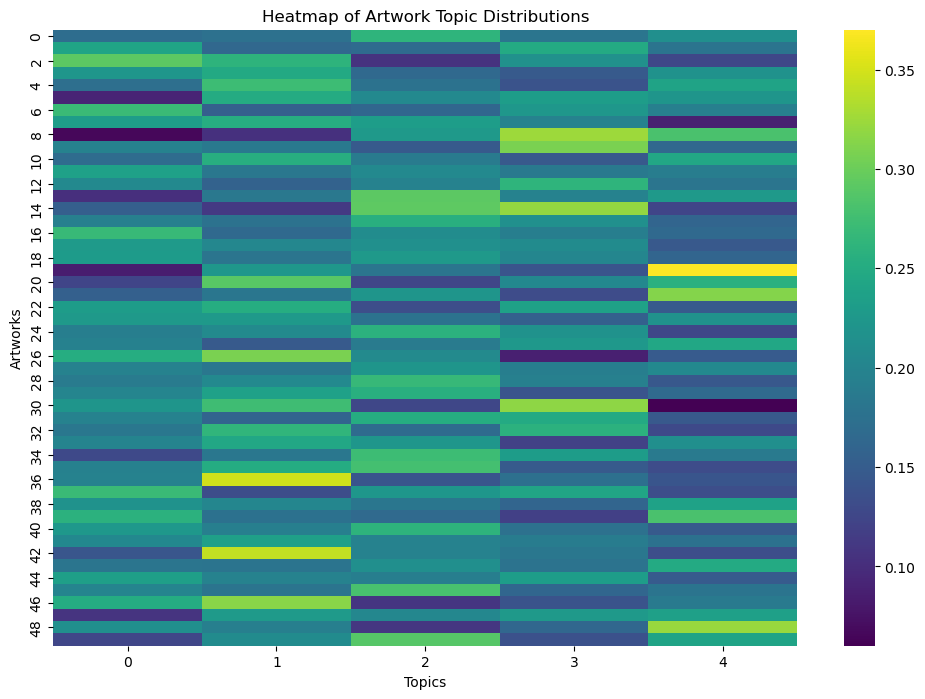

In [ ]:
plt.figure(figsize=(12, 8))
sns.heatmap(selected_artwork_topics, cmap='viridis', annot=False)
plt.xlabel('Topics')
plt.ylabel('Artworks')
plt.title('Heatmap of Artwork Topic Distributions')
plt.show()

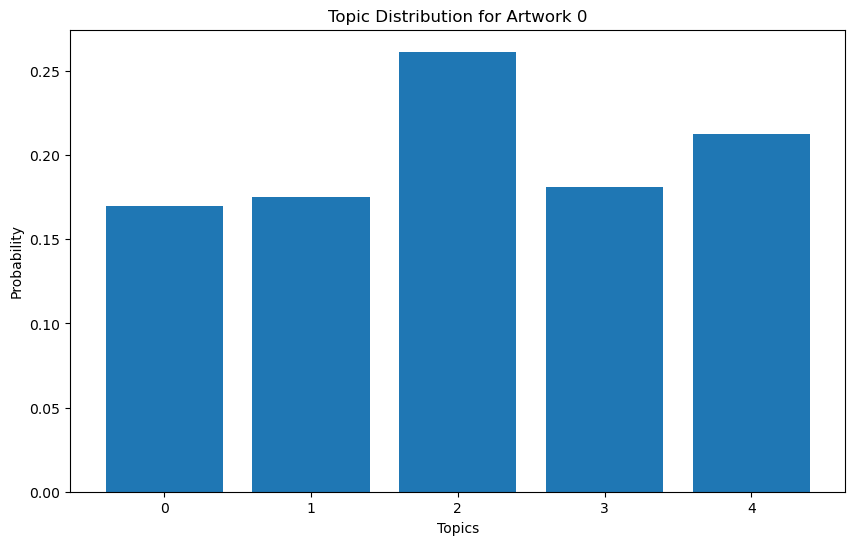

In [ ]:
import matplotlib.pyplot as plt

# Choose an artwork index to visualize (e.g., index 0)
artwork_index = 0
artwork_distribution = artwork_topics[artwork_index]

# Plot the topic distribution for the chosen artwork
plt.figure(figsize=(10, 6))
plt.bar(range(len(artwork_distribution)), artwork_distribution)
plt.xlabel('Topics')
plt.ylabel('Probability')
plt.title(f'Topic Distribution for Artwork {artwork_index}')
plt.show()

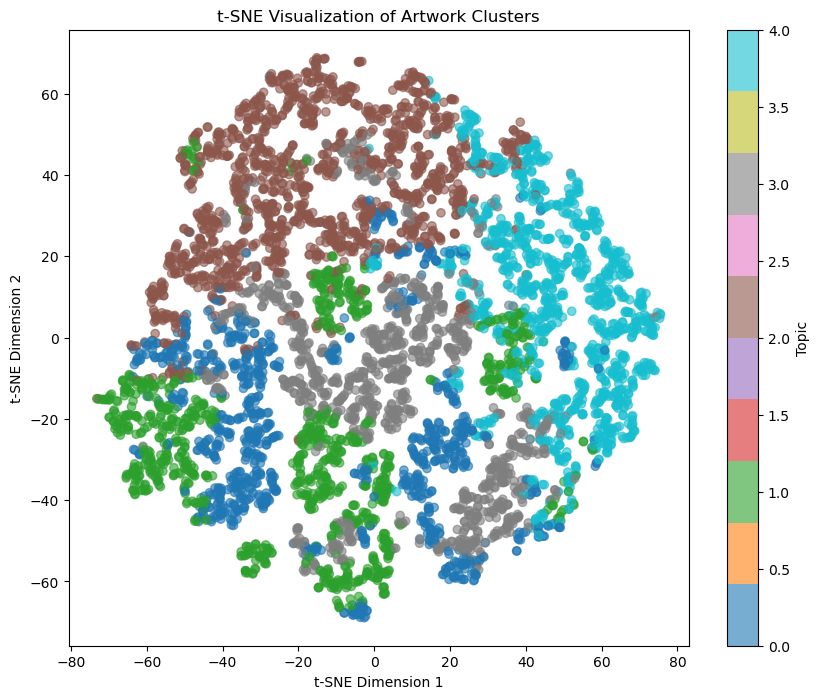

In [ ]:
from sklearn.manifold import TSNE

# Apply t-SNE to reduce topic distribution to 2 dimensions
tsne = TSNE(n_components=2, random_state=42)
tsne_results = tsne.fit_transform(artwork_topics)

# Plot the t-SNE results to visualize clusters
plt.figure(figsize=(10, 8))
plt.scatter(tsne_results[:, 0], tsne_results[:, 1], c=np.argmax(artwork_topics, axis=1), cmap='tab10', alpha=0.6)
plt.xlabel('t-SNE Dimension 1')
plt.ylabel('t-SNE Dimension 2')
plt.title('t-SNE Visualization of Artwork Clusters')
plt.colorbar(label='Topic')
plt.show()

<h1>Identify the Strongest Association for Each Topic


In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import os
from tensorflow.keras.utils import load_img

In [ ]:
topic_index = 2

In [ ]:
topic_column = artwork_topics[:, topic_index]

In [ ]:
N = 5
top_n_indices = topic_column.argsort()[-N:][::-1]

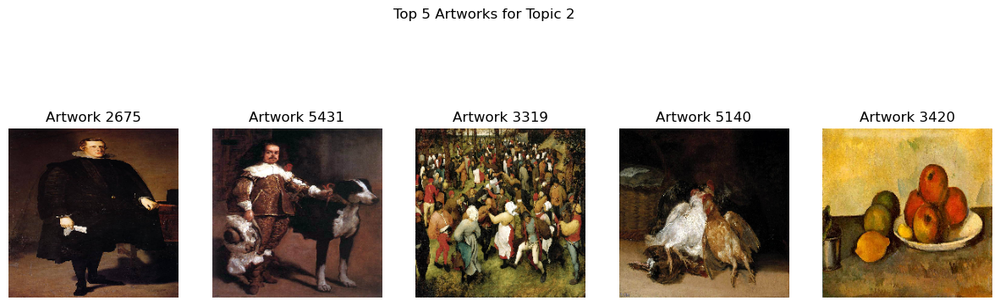

In [ ]:
plt.figure(figsize=(15, 5))
for i, idx in enumerate(top_n_indices):
    img_path = all_image_paths[idx]
    img = load_img(img_path, target_size=(224, 224))

    plt.subplot(1, N, i + 1)
    plt.imshow(img)
    plt.axis('off')
    plt.title(f"Artwork {idx}")

plt.suptitle(f"Top {N} Artworks for Topic {topic_index}")
plt.show()

In [ ]:
for topic_index in range(artwork_topics.shape[1]):  # Iterate through each topic
    print(f"Topic {topic_index}:")

Topic 0:
Topic 1:
Topic 2:
Topic 3:
Topic 4:


In [ ]:
topic_column = artwork_topics[:, topic_index]

In [ ]:
top_n_indices = topic_column.argsort()[-N:][::-1]

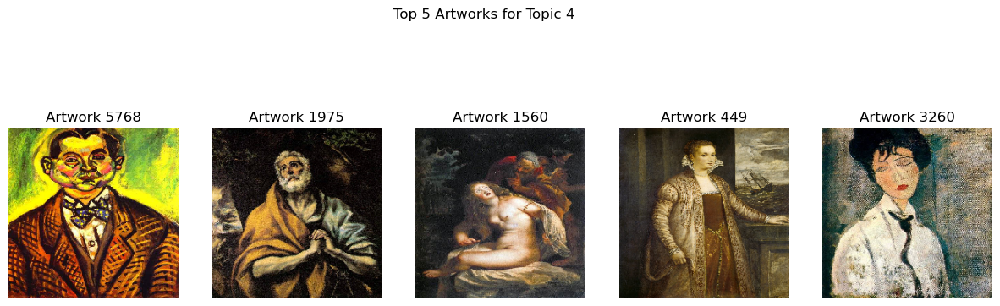

In [ ]:
 plt.figure(figsize=(15, 5))
for i, idx in enumerate(top_n_indices):
        img_path = all_image_paths[idx]
        img = load_img(img_path, target_size=(224, 224))

        plt.subplot(1, N, i + 1)
        plt.imshow(img)
        plt.axis('off')
        plt.title(f"Artwork {idx}")

plt.suptitle(f"Top {N} Artworks for Topic {topic_index}")
plt.show()

<h1> Step to Find the Number of Artworks per Topic <h1>
<h4> first i need to determine the dominant topic for each artwork by looking at the maximum value in the topic distribution for that artwork. Then, we count how many artworks are most strongly associated with each topic. <h3>

In [ ]:
dominant_topics = np.argmax(artwork_topics, axis=1)

# Count the number of artworks in each topic
topic_counts = np.bincount(dominant_topics, minlength=5)

# Display the number of artworks in each topic
for i, count in enumerate(topic_counts):
    print(f"Topic {i}: {count} artworks")

Topic 0: 1030 artworks
Topic 1: 1072 artworks
Topic 2: 1516 artworks
Topic 3: 1130 artworks
Topic 4: 1163 artworks


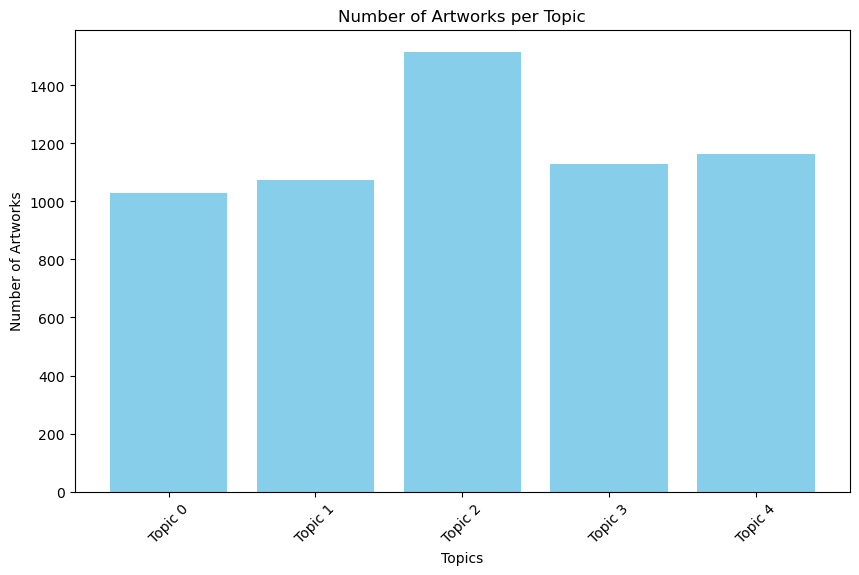

In [ ]:
topics = [f"Topic {i}" for i in range(len(topic_counts))]

plt.figure(figsize=(10, 6))
plt.bar(topics, topic_counts, color='skyblue')
plt.xlabel('Topics')
plt.ylabel('Number of Artworks')
plt.title('Number of Artworks per Topic')
plt.xticks(rotation=45)
plt.show()

<h1> Step to interpret the topics found by LDA by visualizing the top artworks for each topic
<h4> We load ResNet50 with pre-trained weights from ImageNet to generate predictions for the artworks.
This model has knowledge of common objects and scenes that could help describe the content of the images.

In [ ]:
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.applications.resnet50 import preprocess_input, decode_predictions
from tensorflow.keras.preprocessing.image import load_img, img_to_array
import numpy as np

In [ ]:
model = ResNet50(weights='imagenet')

In [ ]:
def generate_tags(image_path):
    img = load_img(image_path, target_size=(224, 224))
    img_array = img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array = preprocess_input(img_array)
    preds = model.predict(img_array)
    decoded_preds = decode_predictions(preds, top=3)[0]
    return [label for (_, label, _) in decoded_preds]


In [ ]:
N = 5

In [ ]:
for topic_index in range(artwork_topics.shape[1]):
    print(f"\nTopic {topic_index}:")
    
    # Get the top N artworks for this topic
    topic_column = artwork_topics[:, topic_index]
    top_n_indices = topic_column.argsort()[-N:][::-1]
    
    # Generate and display tags for the top N artworks
    for idx in top_n_indices:
        img_path = all_image_paths[idx]
        tags = generate_tags(img_path)
        print(f"Artwork {idx} Tags: {tags}")


Topic 0:


1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
Artwork 3898 Tags: ['zebra', 'bull_mastiff', 'book_jacket']
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step
Artwork 2484 Tags: ['Gila_monster', 'volcano', 'book_jacket']
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step
Artwork 5012 Tags: ['bathtub', 'tub', 'lumbermill']
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step
Artwork 4454 Tags: ['book_jacket', 'Chihuahua', 'miniature_pinscher']
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step
Artwork 4369 Tags: ['book_jacket', 'comic_book', 'tray']

Topic 1:
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
Artwork 5476 Tags: ['wolf_spider', 'king_crab', 'rock_crab']
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step
Artwork 5755 Tags: ['prayer_rug', 'quilt', 'maze']
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step
Artwork 4757 Tags: ['viaduct', 'steel_arch_bridge', 'triumphal_arch']
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step
Artwork 1444 Tags: ['altar', 'vestment', 'jigsaw_puzzle']
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step
Artwork 1164 Tags: ['castle', 'monastery', 'alp']

Topic 2:
1/1

<h1> Next Step: Artist-Level Analysis and Clustering

In [ ]:
train_csv_path = 'train.csv'  # Path to the CSV with artist information
train_data = pd.read_csv(train_csv_path)



In [ ]:

# Create a DataFrame for the topic distribution of artworks, including the artist column
topic_df = pd.DataFrame(artwork_topics, columns=[f'Topic_{i}' for i in range(artwork_topics.shape[1])])
topic_df['id'] = train_data['id']
topic_df['artist'] = train_data['artist']

In [ ]:
artist_topic_distribution = topic_df.groupby('artist').mean().reset_index()


In [ ]:
print(artist_topic_distribution.head())

              artist   Topic_0   Topic_1   Topic_2   Topic_3   Topic_4  \
0    Albrecht Du rer  0.203801  0.203562  0.206830  0.194862  0.190945   
1      Alfred Sisley  0.198571  0.200717  0.207683  0.207347  0.185683   
2  Amedeo Modigliani  0.194341  0.196938  0.218546  0.200537  0.189638   
3      Andrei Rublev  0.182587  0.191145  0.212285  0.214327  0.199656   
4        Andy Warhol  0.192539  0.196535  0.203595  0.207905  0.199427   

            id  
0  2851.481818  
1  3012.689024  
2  3014.128788  
3  2848.986486  
4  3061.371212  


In [ ]:
artist_topic_distribution.tail() 

,artist,Topic_0,Topic_1,Topic_2,Topic_3,Topic_4,id
45,Sandro Botticelli,0.192815,0.199496,0.210630,0.196145,0.200915,3046.275000
46,Titian,0.191081,0.193090,0.213351,0.203834,0.198643,3053.352601
47,Vasiliy Kandinskiy,0.199297,0.190278,0.204972,0.210316,0.195136,2874.900000
48,Vincent van Gogh,0.196880,0.195285,0.210700,0.202746,0.194390,2959.435612
49,William Turner,0.190333,0.210841,0.208256,0.194035,0.196535,3086.840909


In [ ]:
from sklearn.cluster import KMeans

In [ ]:
artist_topic_distribution.count()

artist     50
Topic_0    50
Topic_1    50
Topic_2    50
Topic_3    50
Topic_4    50
id         50
dtype: int64

In [ ]:
artist_features = artist_topic_distribution.drop(columns=['artist'])

In [ ]:
num_clusters = 5

In [ ]:
kmeans = KMeans(n_clusters=num_clusters, random_state=42)
artist_topic_distribution['cluster'] = kmeans.fit_predict(artist_features)

In [ ]:
kmeans = KMeans(n_clusters=num_clusters, random_state=42)
artist_topic_distribution['cluster'] = kmeans.fit_predict(artist_features)

In [ ]:
print(artist_topic_distribution[['artist', 'cluster']])

                       artist  cluster
0             Albrecht Du rer        1
1               Alfred Sisley        2
2           Amedeo Modigliani        2
3               Andrei Rublev        1
4                 Andy Warhol        2
5            Camille Pissarro        1
6                  Caravaggio        4
7                Claude Monet        3
8                Diego Rivera        4
9             Diego Velazquez        3
10                Edgar Degas        2
11              Edouard Manet        3
12               Edvard Munch        1
13                   El Greco        3
14           Eugene Delacroix        3
15             Francisco Goya        2
16                Frida Kahlo        2
17             Georges Seurat        3
18          Giotto di Bondone        0
19               Gustav Klimt        0
20            Gustave Courbet        2
21              Henri Matisse        4
22             Henri Rousseau        2
23  Henri de Toulouse-Lautrec        1
24           Hieronymus B

In [ ]:
# Use PCA to reduce dimensionality to 2D for visualization
pca = PCA(n_components=2)
artist_pca = pca.fit_transform(artist_features)

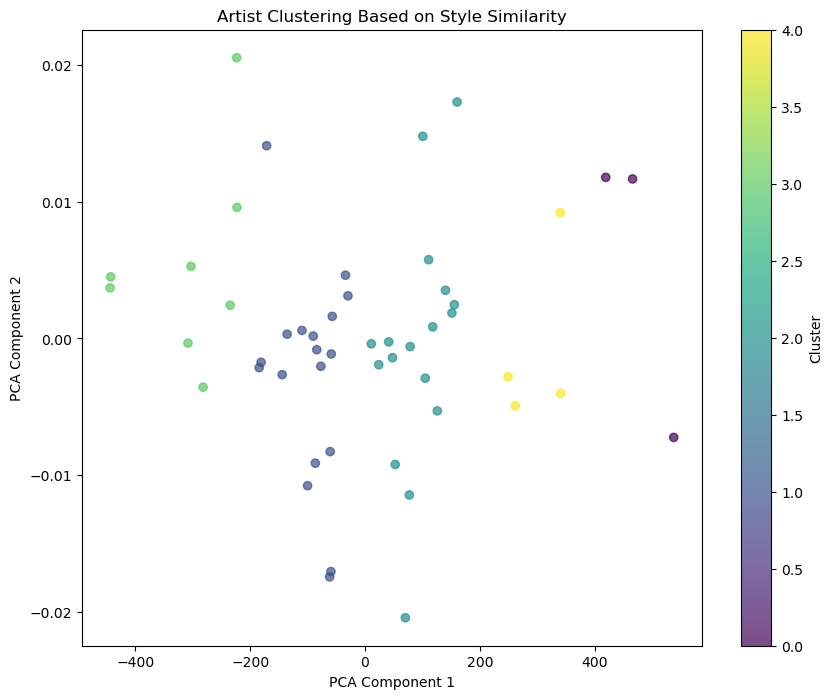

In [ ]:
# Create a scatter plot to visualize the clusters
plt.figure(figsize=(10, 8))
plt.scatter(artist_pca[:, 0], artist_pca[:, 1], c=artist_topic_distribution['cluster'], cmap='viridis', alpha=0.7)
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.title('Artist Clustering Based on Style Similarity')
plt.colorbar(label='Cluster')
plt.show()

In [ ]:
# Group by cluster and calculate the mean topic distribution for each cluster
# Make sure to select only numeric columns for aggregation
numeric_columns = [col for col in artist_topic_distribution.columns if col.startswith('Topic_')]
cluster_avg_distribution = artist_topic_distribution.groupby('cluster')[numeric_columns].mean()

# Display the average topic distribution for each cluster
print(cluster_avg_distribution)

          Topic_0   Topic_1   Topic_2   Topic_3   Topic_4
cluster                                                  
0        0.199987  0.198116  0.204678  0.198295  0.198924
1        0.196218  0.195889  0.207660  0.202981  0.197252
2        0.195513  0.199417  0.208532  0.200417  0.196121
3        0.195184  0.194513  0.211594  0.195862  0.202847
4        0.196149  0.198442  0.207419  0.202441  0.195549



Cluster 0 (3 artists):
Representative artist: Giotto di Bondone


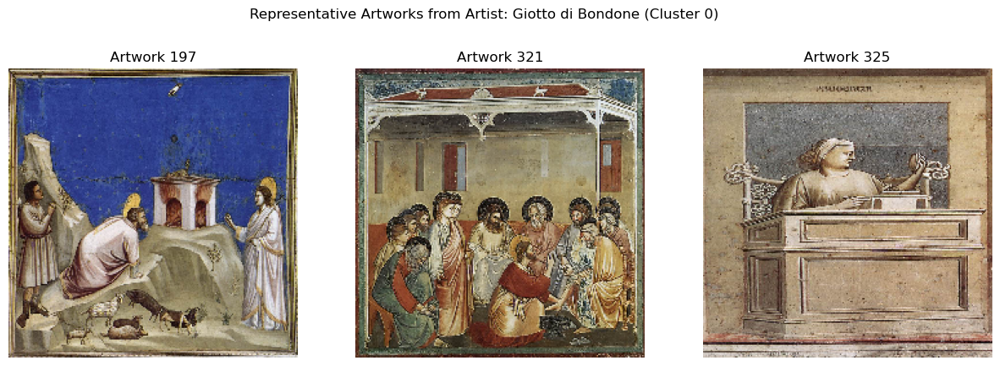

Representative artist: Gustav Klimt


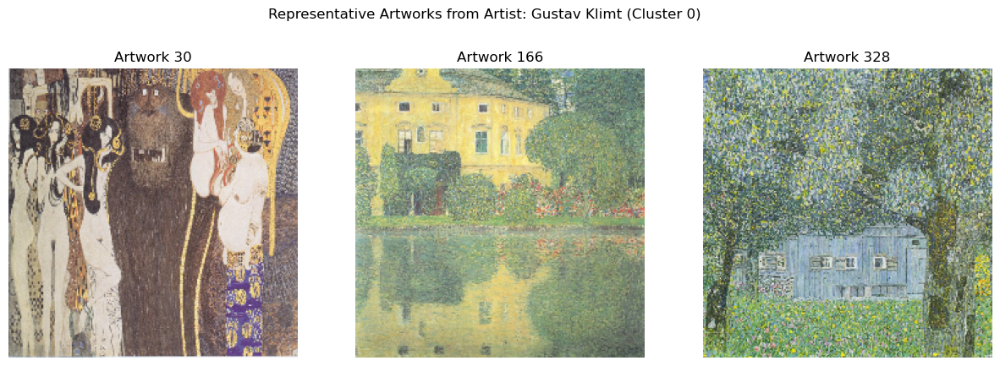

Representative artist: Paul Cezanne


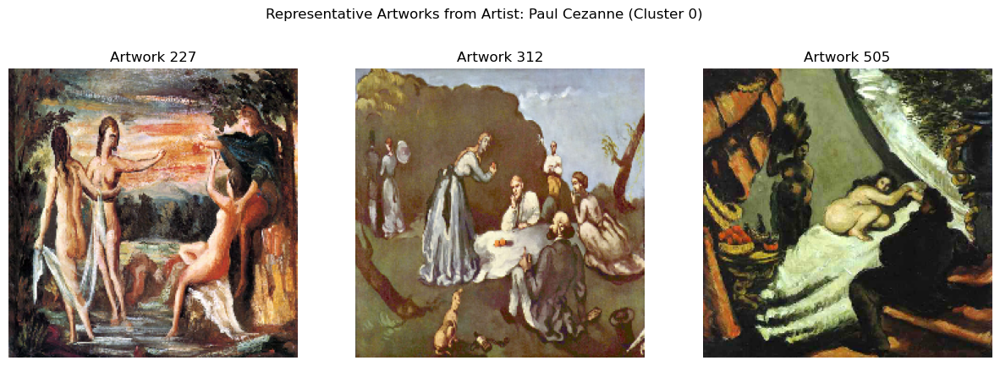


Cluster 1 (18 artists):
Representative artist: Albrecht Du rer


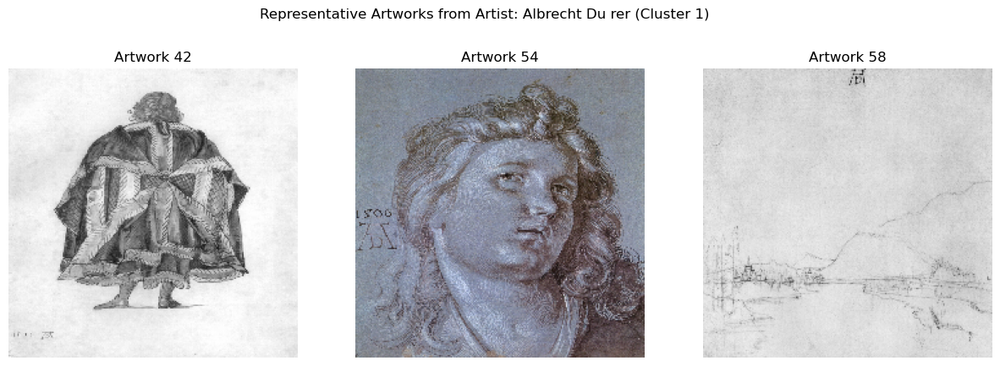

Representative artist: Andrei Rublev


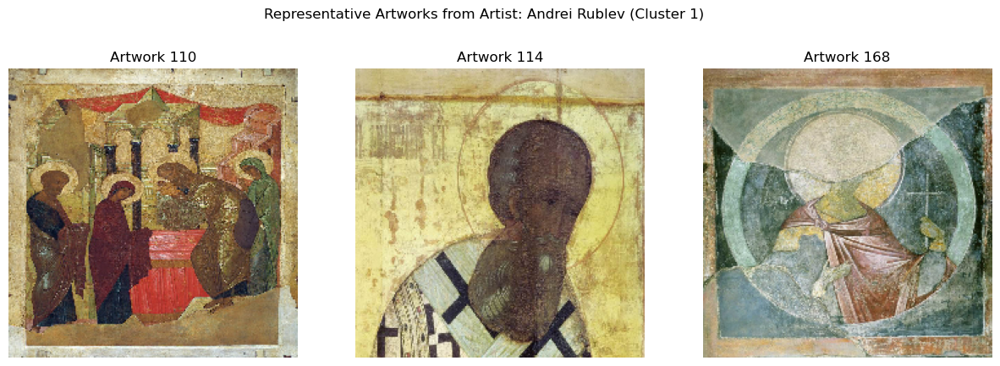

Representative artist: Camille Pissarro


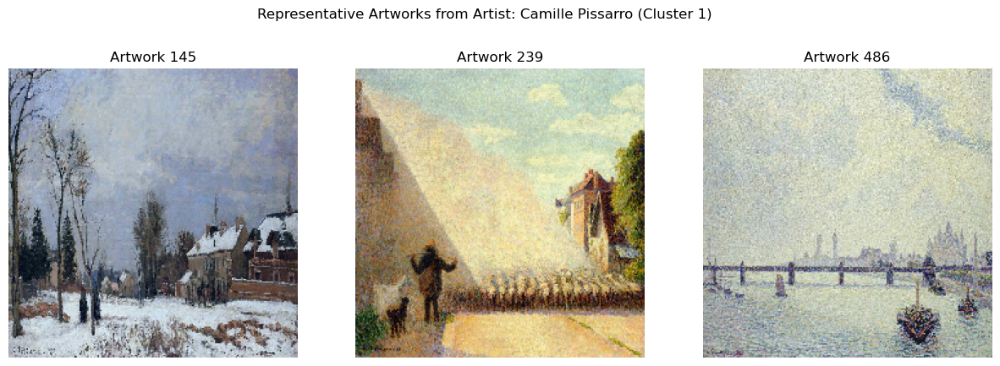


Cluster 2 (17 artists):
Representative artist: Alfred Sisley


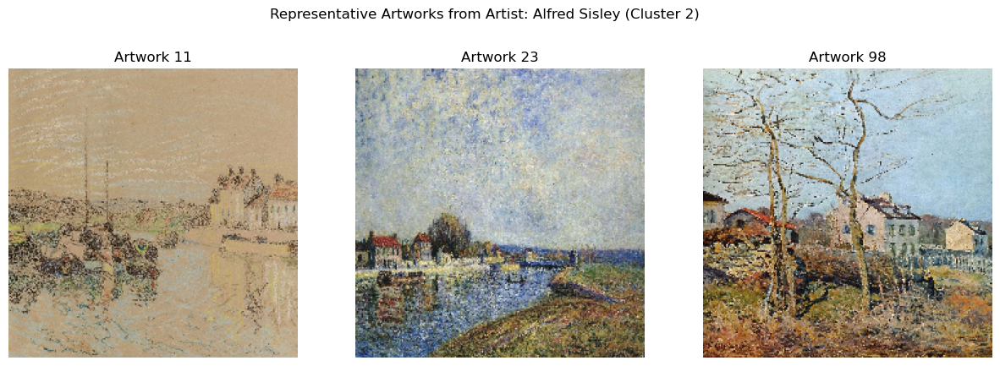

Representative artist: Amedeo Modigliani


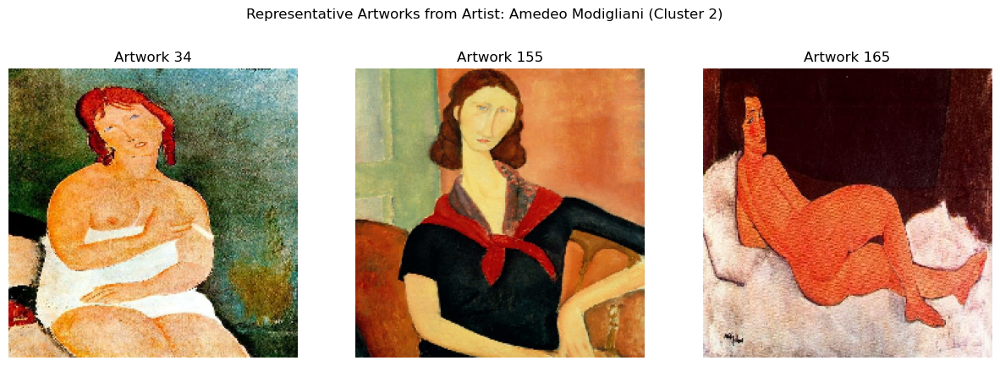

Representative artist: Andy Warhol


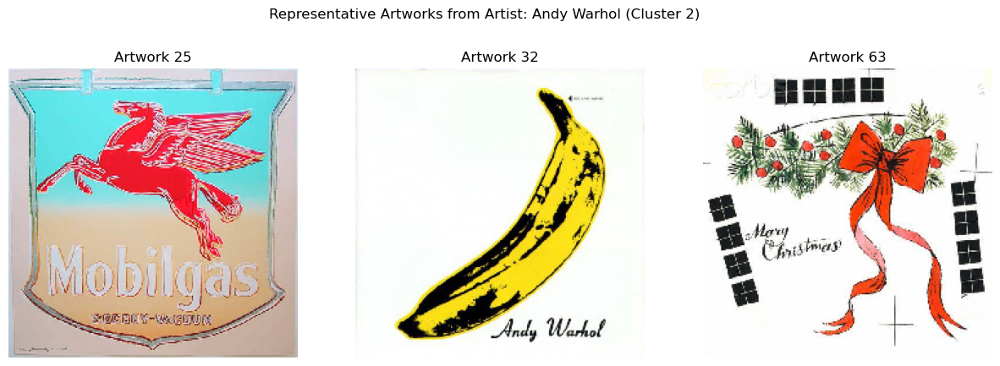


Cluster 3 (8 artists):
Representative artist: Claude Monet


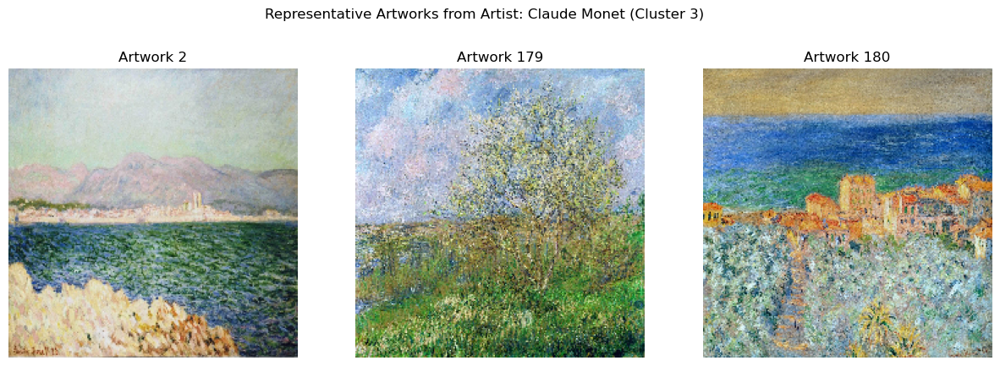

Representative artist: Diego Velazquez


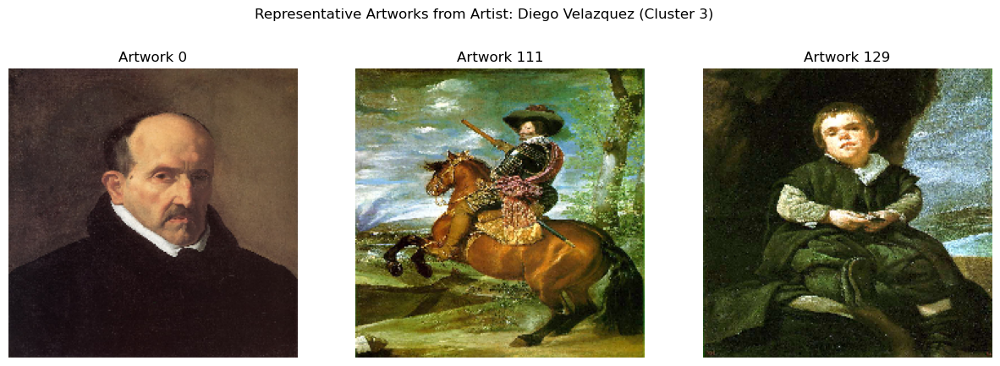

Representative artist: Edouard Manet


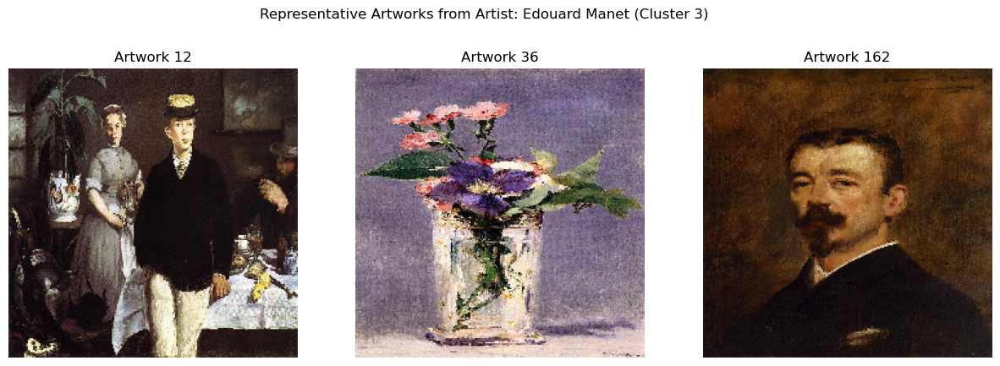


Cluster 4 (4 artists):
Representative artist: Caravaggio


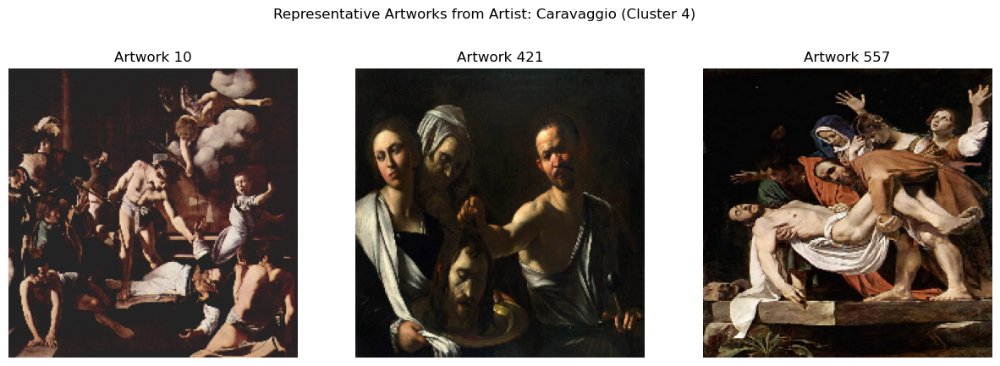

Representative artist: Diego Rivera


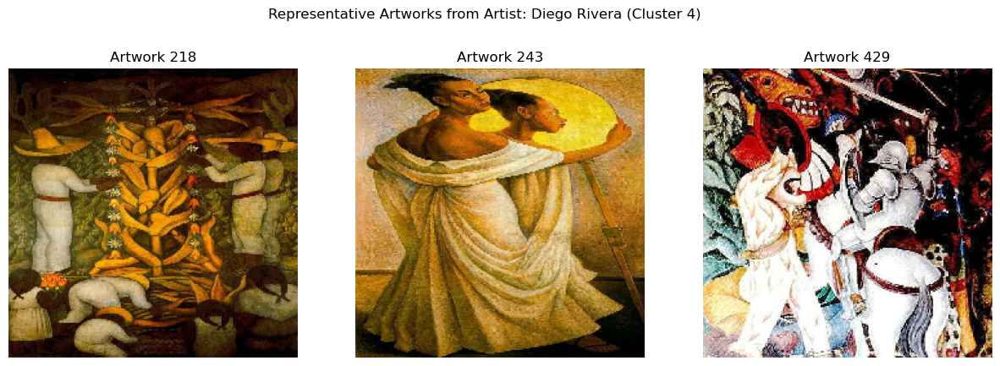

Representative artist: Henri Matisse


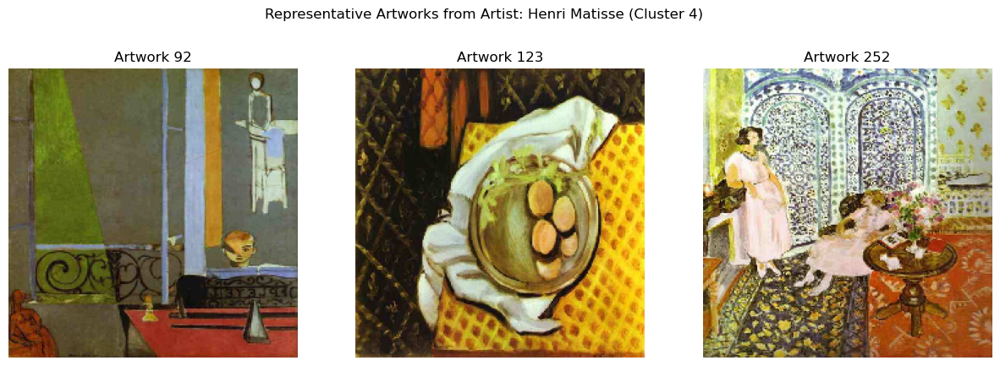

In [ ]:
num_artists_to_analyze = 3

# Select a few artists from each cluster
for cluster_id in range(num_clusters):
    # Get the artists in this cluster
    cluster_artists = artist_topic_distribution[artist_topic_distribution['cluster'] == cluster_id]['artist'].values
    print(f"\nCluster {cluster_id} ({len(cluster_artists)} artists):")

    # Loop over a few artists from the cluster
    for i in range(min(num_artists_to_analyze, len(cluster_artists))):
        artist_name = cluster_artists[i]
        print(f"Representative artist: {artist_name}")

        # Get the artworks for the selected artist
        artist_artworks = train_data[train_data['artist'] == artist_name]
        artwork_paths = artist_artworks['img_path'].values

        # Display up to 3 artworks for the selected artist
        plt.figure(figsize=(15, 5))
        for j, img_path in enumerate(artwork_paths[:3]):
            img = load_img(img_path, target_size=(224, 224))

            plt.subplot(1, 3, j + 1)
            plt.imshow(img)
            plt.axis('off')
            plt.title(f"Artwork {artist_artworks['id'].values[j]}")

        plt.suptitle(f"Representative Artworks from Artist: {artist_name} (Cluster {cluster_id})")
        plt.show()

In [ ]:
artist_count_per_cluster = artist_topic_distribution.groupby('cluster')['artist'].nunique()

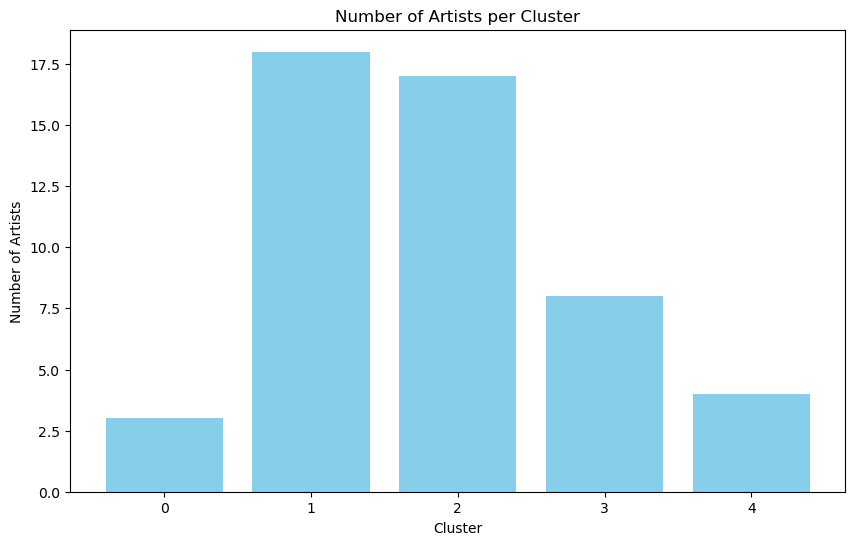

In [ ]:
plt.figure(figsize=(10, 6))
plt.bar(artist_count_per_cluster.index, artist_count_per_cluster.values, color='skyblue')
plt.xlabel('Cluster')
plt.ylabel('Number of Artists')
plt.title('Number of Artists per Cluster')
plt.xticks(artist_count_per_cluster.index)
plt.show()

In [ ]:
total_artists_per_cluster = artist_topic_distribution.groupby('cluster')['artist'].nunique()
total_artists_per_cluster

cluster
0     3
1    18
2    17
3     8
4     4
Name: artist, dtype: int64

In [ ]:
artists_per_cluster = artist_topic_distribution.groupby('cluster')['artist'].unique()


In [ ]:
for cluster, artists in artists_per_cluster.items():
    print(f"Cluster {cluster}:")
    print(", ".join(artists))
    print()

Cluster 0:
Giotto di Bondone, Gustav Klimt, Paul Cezanne

Cluster 1:
Albrecht Du rer, Andrei Rublev, Camille Pissarro, Edvard Munch, Henri de Toulouse-Lautrec, Hieronymus Bosch, Jan van Eyck, Kazimir Malevich, Marc Chagall, Mikhail Vrubel, Pablo Picasso, Paul Klee, Peter Paul Rubens, Pieter Bruegel, Raphael, Rembrandt, Rene Magritte, Vasiliy Kandinskiy

Cluster 2:
Alfred Sisley, Amedeo Modigliani, Andy Warhol, Edgar Degas, Francisco Goya, Frida Kahlo, Gustave Courbet, Henri Rousseau, Leonardo da Vinci, Michelangelo, Paul Gauguin, Pierre-Auguste Renoir, Piet Mondrian, Sandro Botticelli, Titian, Vincent van Gogh, William Turner

Cluster 3:
Claude Monet, Diego Velazquez, Edouard Manet, El Greco, Eugene Delacroix, Georges Seurat, Jackson Pollock, Joan Miro

Cluster 4:
Caravaggio, Diego Rivera, Henri Matisse, Salvador Dali



In [ ]:

#from sklearn.metrics import silhouette_score

# Assuming 'pca_features' is the data you used for clustering
#silhouette_avg = silhouette_score(test_features_flat, test_cluster_labels)
#print(f"Silhouette Score: {silhouette_avg:.2f}")

<h1> Testing and evaluating part
<h4> implementing this part which is to fit the LDA model for different numbers of topics and calculate the metrics.

In [ ]:
from sklearn.decomposition import PCA
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.metrics import silhouette_score
import numpy as np
import matplotlib.pyplot as plt